<table style="border:2px solid white;" cellspacing="0" cellpadding="0" border-collapse: collapse; border-spacing: 0;>
  <tr> 
    <th style="background-color:white"> <img src="../media/ccal-logo-D3.png" width=225 height=225></th>
    <th style="background-color:white"> <img src="../media/logoMoores.jpg" width=175 height=175></th>
    <th style="background-color:white"> <img src="../media/GP.png" width=200 height=200></th>
    <th style="background-color:white"> <img src="../media/UCSD_School_of_Medicine_logo.png" width=175 height=175></th> 
    <th style="background-color:white"> <img src="../media/Broad.png" width=130 height=130></th> 
  </tr>
</table>

**Part 6 of building a PlatiRes Map**   
Daniela Nachmanson *Fall 2017*

In [ ]:
Using the Chapter 7 of the **Resistance to Platinum-Based Drugs notebooks** to plot out resistance on the GPS map and whether t.
The genelist used in this NMF is derived from bulkRNA seq experiment done in Professor Harismendy's as well as an experiment performed in Marchion et al experiment.

<hr style="border: none; border-bottom: 3px solid #88BBEE;">
# **Resistance to Platinum-Based Drugs**
##  **Displaying Genomic and Functional Features in the Global Onco-*GPS* Map**

**Authors:** 
Thorin Tabor - *UCSD Mesirov lab*      
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; 
Steve Howell - *UCSD Moores Cancer Center*  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; 
Olivier Harismendy - *UCSD Moores Cancer Center*     
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; 
Jill Mesirov - *UCSD School of Medicine and Moores Cancer Center*   
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;
Pablo Tamayo - *Computational Cancer Analysis Laboratory (CCAL), UCSD Moores Cancer Center* 

**Date:** May 5, 2017

**Article:** [*Kim et al.* Decomposing Oncogenic Transcriptional Signatures to Generate Maps of Divergent Cellular States](https://drive.google.com/file/d/0B0MQqMWLrsA4b2RUTTAzNjFmVkk/view?usp=sharing)

**Analysis overview:**  In this notebook we will use the global Onco-GPS to visualize the association of selected pathway, protein and gene expression profiles relevant to resistance to platinum-based drugs.


<hr style="border: none; border-bottom: 3px solid #88BBEE;">
### 1. Set up notebook and import Computational Cancer Analysis Library ([CCAL](https://github.com/KwatME/ccal))

In [37]:
from environment import *

%matplotlib inline
%load_ext autoreload
%autoreload 2
import seaborn as sns

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


<hr style="border: none; border-bottom: 3px solid #88BBEE;">
### 2. Read the feature datasets

In [38]:
mut_cna_df = ccal.read_gct('../data/ccle_mut_cna.gct')
mut_cna2_df = ccal.read_gct('../data/CCLE_hc_mutations_2011-06-01.gct')
gene_dependency_df = ccal.read_gct('../data/ccle_gene_dependency.gct')
gene_dependency2_df = ccal.read_gct('../data/Achilles_QC_v2.4.2_Demeter.rnai.v2.gct')
gene_expression_df = ccal.read_gct('../data/ccle_gene_expression.gct')
pathway_expression_df = ccal.read_gct('../data/ccle_pathway_expression_all.gct')
regulator_df = ccal.read_gct('../data/ccle_regulator.gct')
protein_expression_df = ccal.read_gct('../data/ccle_protein_expression.gct')
tissue_df = ccal.read_gct('../data/ccle_tissue.gct')
drug_sensitivity_df = ccal.read_gct('../data/ccle_drug_sensitivity.gct')
drug_sensitivity2_df = ccal.read_gct('../data/all.cpds.auc08.gct')
prom_methyl_df = ccal.read_gct('../data/ccle_prom_DNA_methyl.gct')
metabolites_df = ccal.read_gct('../data/ccle_metabolites.dat.gct')

### Number of Ovarian samples

In [6]:
tissue_df.loc['ovary'].sum()

52

<hr style="border: none; border-bottom: 3px solid #88BBEE;">
### 3. Read oncogenic components and global clustering labels
<hr style="border: none; border-bottom: 1px solid #88BBEE;">
#### 3.1 Read H matrix with all components

In [7]:
h_matrix = ccal.read_gct('../output/nmf_cc/nmf/nmf_k7_h.gct')

<hr style="border: none; border-bottom: 1px solid #88BBEE;">
#### 3.2 Read the global clustering labels and select state labels for the k=9 oncogenic states

In [8]:
global_clusterings = ccal.read_gct('../output/global/clusterings/clusterings.gct')
global_sample_labels = global_clusterings.ix[9, :]

<hr style="border: none; border-bottom: 3px solid #88BBEE;">
### 4 Display global Onco-GPS map and resistance profiles for platinum-based drugs

In [9]:
component_names = ['C1','C2','C3','C4','C5','C6','C7']

colors = ['#993300',  # Brown
                '#FFD700',  # Gold
                '#E74C3C',  # Red
                '#8B008B',  # Dark magenta  
                '#B0E0E6',  # Powder blue
                '#4169E1',  # Royal blue
                '#DC143C', # Crimson  
                '#669999',   # Green
                '#F4BD60']  # Light sandy brown
               # '#2E8B57',  # Sea green
               # '#4b0082',  # Indigo 
               # '#D2691E',  # Chocolate
               # '#FA8072',  # Salmon
               # '#DA70D6', # Orchid  
               # '#90EE90']  # Light green 

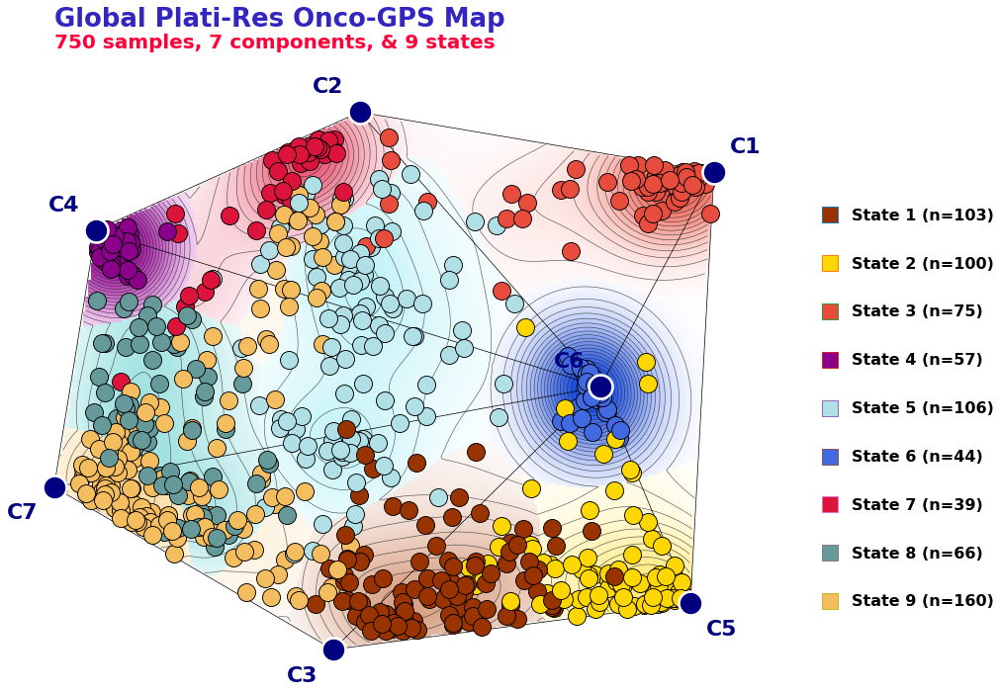

In [14]:
ccal.oncogps.make_oncogps(training_h = h_matrix, 
                                                  training_states = global_sample_labels, 
                                                  title = 'Global Plati-Res Onco-GPS Map',
                                                  power = 2.5,
                                                  component_markersize = 24,
                                                  component_fontsize = 22,
                                                  component_markerfacecolor='#000080',
                                                  sample_markersize = 18,
                                                  mds_seed = 1234,
                                                  std_max = 2,
                                                  state_colors = colors,
                                                  kde_bandwidth_factor=1.25,
                                                  informational_mds = False,
                                                  component_names = component_names)
                                                  #filepath = DIR_RESULT + '/Global_Onco-GPS.pdf')

#### Show ovarian cancer sample

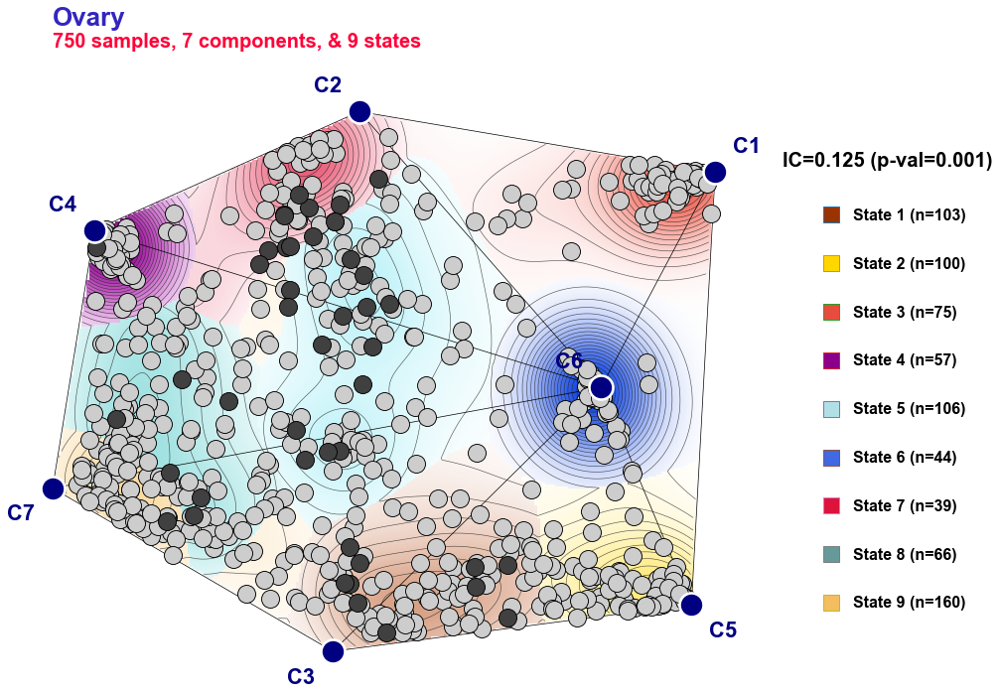

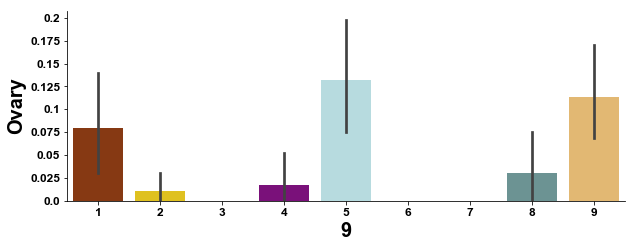

In [15]:
for i, alias in [('ovary', 'Ovary')]:
                        # ('lung', 'Lung Cancers'),
                       # ('skin', 'Melanomas'),
                       # ('upper_aerodigestive_tract','upper_aerodigestive_tract'),
                       # ('lung.carcinoma.small_cell_carcinoma','lung.carcinoma.small_cell_carcinoma'),
                        #('pancreas', 'Pancreatic Cancers')]:
    
    annotation = tissue_df.ix[i, :]
    annotation.name = alias

    ccal.oncogps.make_oncogps(training_h = h_matrix, 
                                                  training_states = global_sample_labels, 
                                                  annotation_type = 'binary',
                                                  training_annotation=annotation,
                                                  title=annotation.name,
                                                  power = 2.5,
                                                  component_markersize = 24,
                                                  component_fontsize = 22,
                                                  component_markerfacecolor='#000080',
                                                  sample_markersize = 18,
                                                  mds_seed = 1234,
                                                  std_max = 2,
                                                  informational_mds = False,
                                                  state_colors = colors,
                                                  kde_bandwidth_factor=1.25,
                                                  component_names = component_names)
                                                  #filepath = '/Users/tamayo/Desktop/Global_Onco-GPS_Feature_{}.pdf'.format(annotation.name))   
    
    ccal.plot_violin_box_or_bar(global_sample_labels, annotation.ix[global_sample_labels.index], colors=colors,
                                                  violin_or_box='box', figure_size=(10,3.5))

#### Display the sensitivity to platinum-based drugs

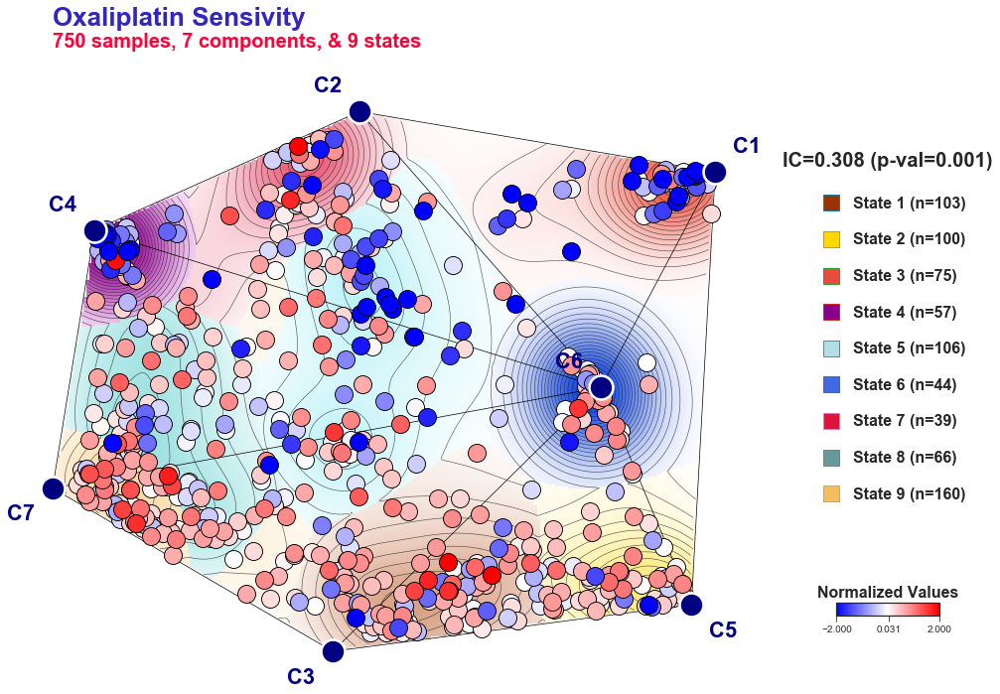

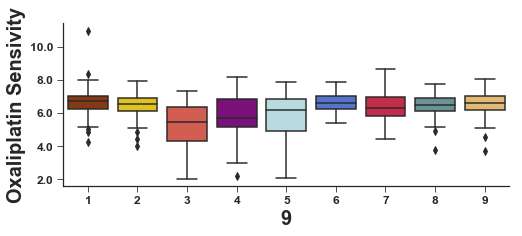

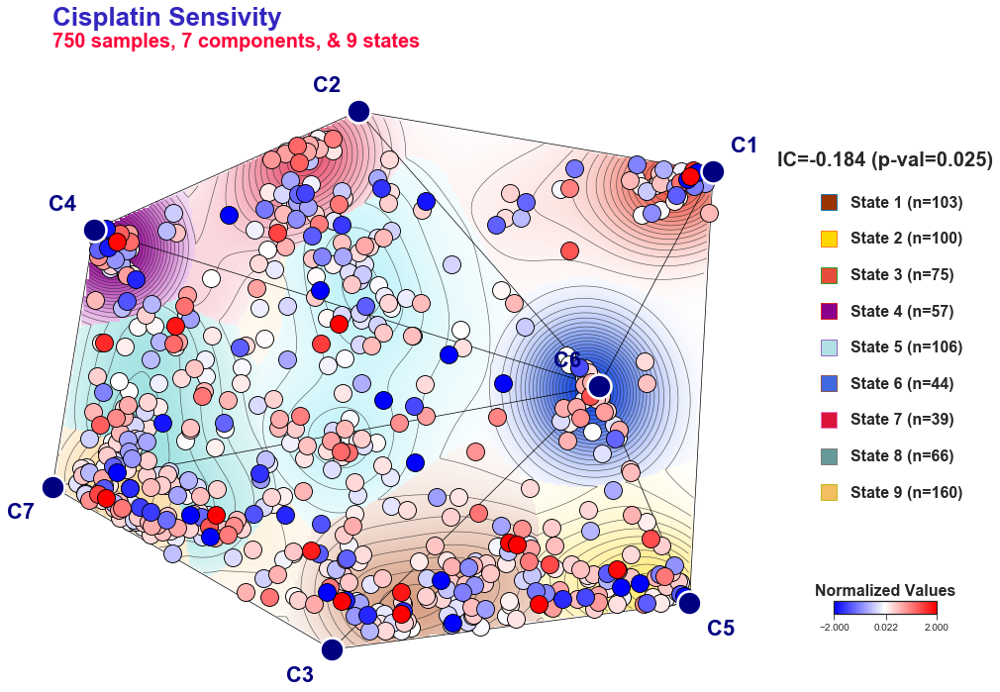

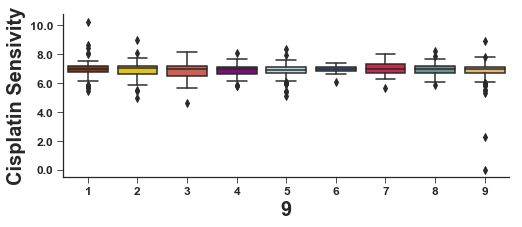

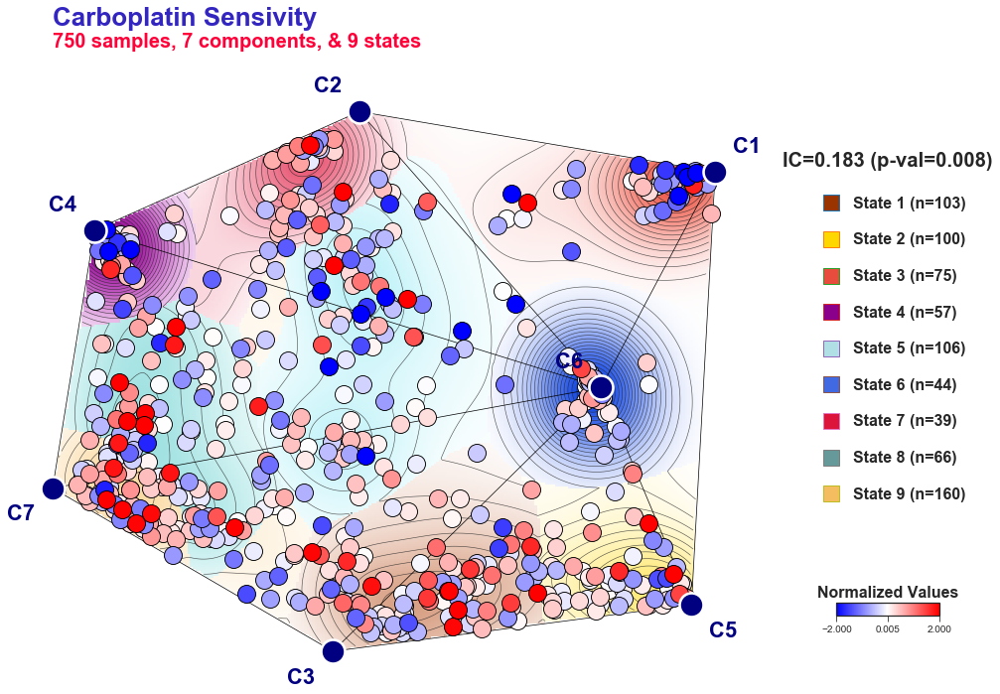

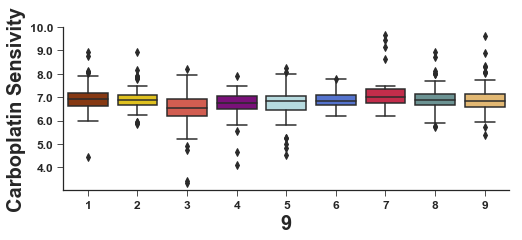

In [18]:
for i, alias in [('oxaliplatin', 'Oxaliplatin Sensivity'),
                        ('cisplatin', 'Cisplatin Sensivity'),
                        ('carboplatin', 'Carboplatin Sensivity')]:
    
    annotation = drug_sensitivity2_df.ix[i, :]
    annotation.name = alias
    
    ccal.oncogps.make_oncogps(training_h = h_matrix, 
                                                  training_states = global_sample_labels, 
                                                  training_annotation=annotation,
                                                  title=annotation.name,
                                                  power = 2.5,
                                                  component_markersize = 24,
                                                  component_fontsize = 22,
                                                  component_markerfacecolor='#000080',
                                                  sample_markersize = 18,
                                                  mds_seed = 1234,
                                                  std_max = 2,
                                                  informational_mds = False,
                                                  state_colors = colors,
                                                  annotation_ascending=False,
                                                  kde_bandwidth_factor=1.25,
                                                  component_names = component_names)
                                                  #filepath = DIR_RESULT + '/Platinum_Resistance/Onco-GPS_Feature_{}.pdf'.format(annotation.name))
    
    ccal.plot_violin_box_or_bar(global_sample_labels, annotation.ix[global_sample_labels.index], colors=colors,
                                                       violin_or_box='box', figure_size=(8, 3))

## Display NSD1 Expression

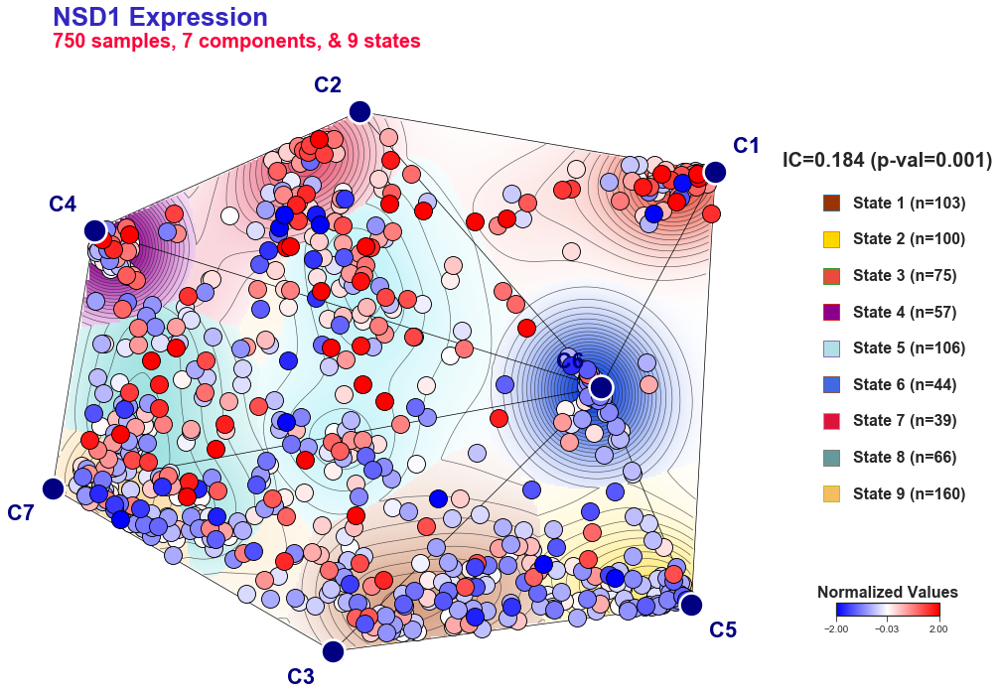

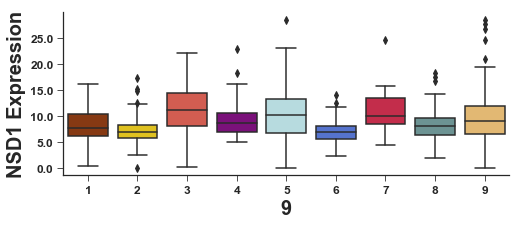

In [15]:
for i, alias in [('NSD1', 'NSD1 Expression')]:
        
    annotation = gene_expression_df.ix[i, :]
    annotation.name = alias
    
    ccal.oncogps.make_oncogps(training_h = h_matrix, 
                                                  training_states = global_sample_labels, 
                                                  training_annotation=annotation,
                                                  title=annotation.name,
                                                  power = 2.5,
                                                  component_markersize = 24,
                                                  component_fontsize = 22,
                                                  component_markerfacecolor='#000080',
                                                  sample_markersize = 18,
                                                  mds_seed = 1234,
                                                  std_max = 2,
                                                  informational_mds = False,
                                                  state_colors = colors,
                                                  annotation_ascending=False,
                                                  kde_bandwidth_factor=1.25,
                                                  component_names = component_names)
                                                  #filepath = DIR_RESULT + '/Platinum_Resistance/Onco-GPS_Feature_{}.pdf'.format(annotation.name))
    
    ccal.plot_violin_box_or_bar(global_sample_labels, annotation.ix[global_sample_labels.index], colors=colors,
                                                       violin_or_box='box', figure_size=(8, 3))
    
    

## Display NSD1 CNA/Mutations

## mut_cna_df:
* NSD1_AMP
* NSD1_DEL
* NSD1_MUT

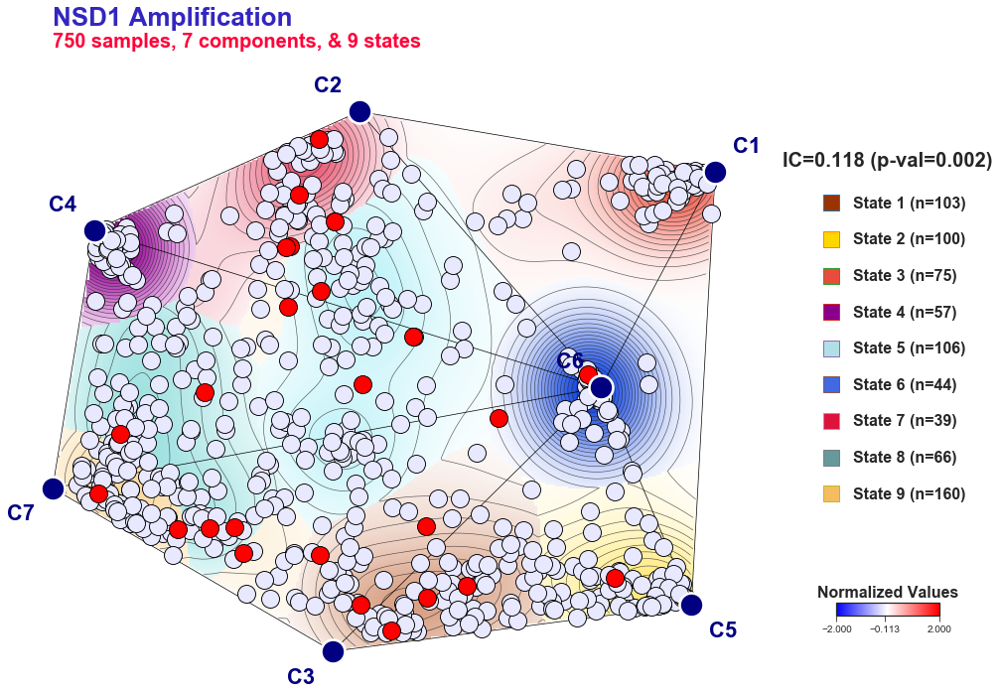

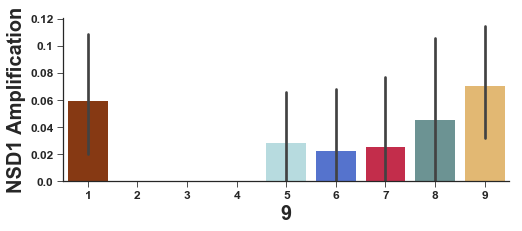

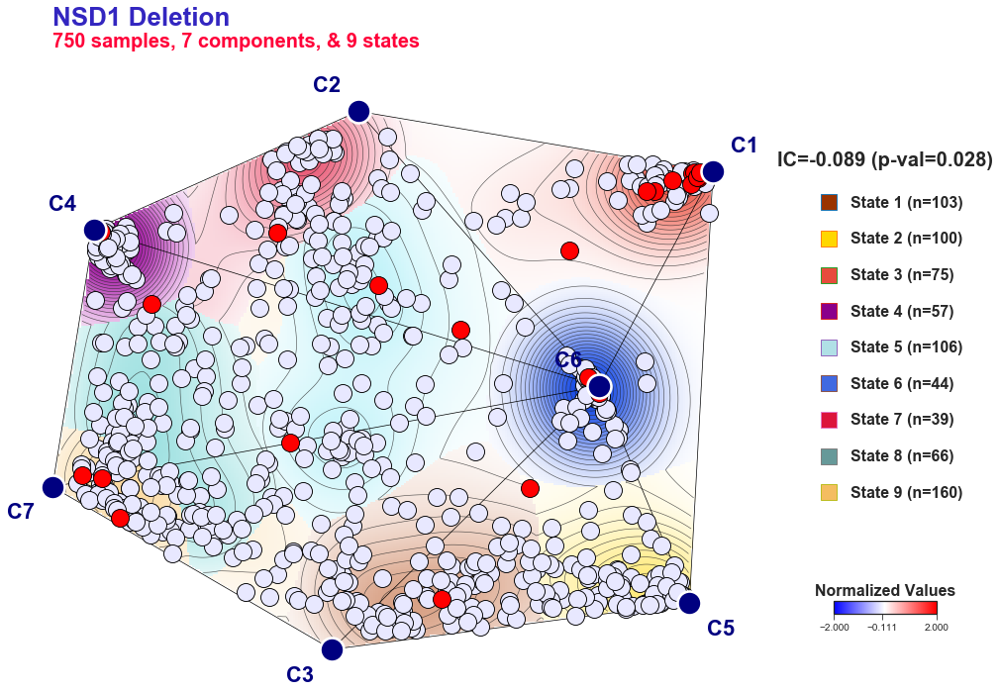

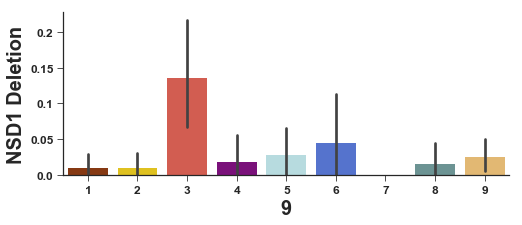

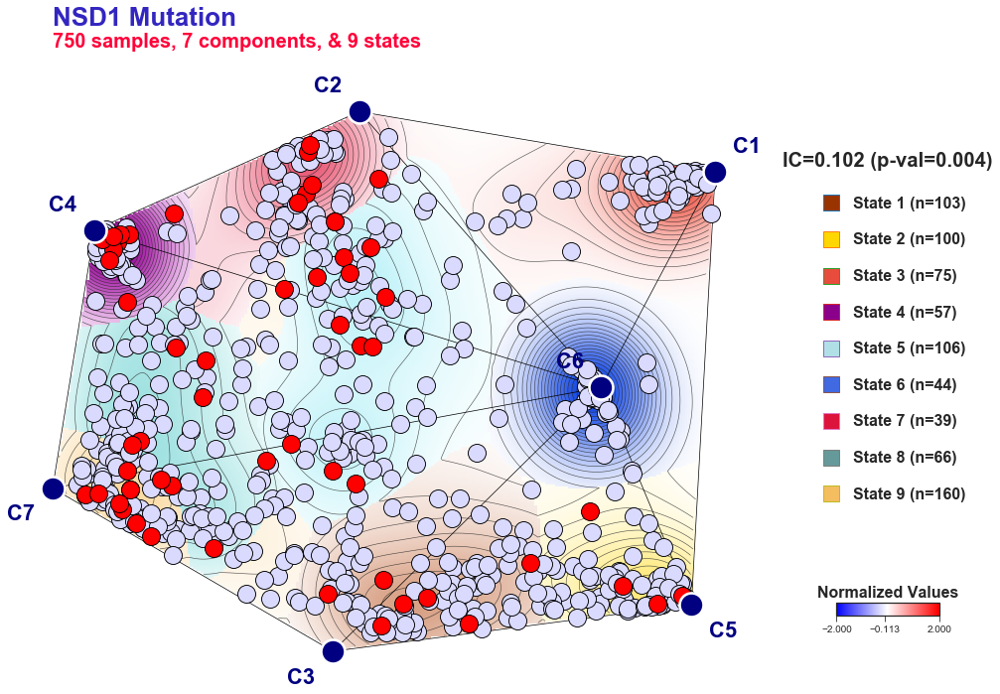

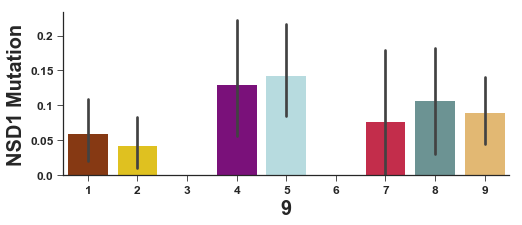

In [28]:
for i, alias in [('NSD1_AMP', 'NSD1 Amplification'),
                 ('NSD1_DEL', 'NSD1 Deletion'),
                 ('NSD1_MUT', 'NSD1 Mutation')]:
        
    annotation = mut_cna_df.ix[i, :]
    annotation.name = alias
    
    ccal.oncogps.make_oncogps(training_h = h_matrix, 
                                                  training_states = global_sample_labels, 
                                                  training_annotation=annotation,
                                                  title=annotation.name,
                                                  power = 2.5,
                                                  component_markersize = 24,
                                                  component_fontsize = 22,
                                                  component_markerfacecolor='#000080',
                                                  sample_markersize = 18,
                                                  mds_seed = 1234,
                                                  std_max = 2,
                                                  informational_mds = False,
                                                  state_colors = colors,
                                                  annotation_ascending=False,
                                                  kde_bandwidth_factor=1.25,
                                                  component_names = component_names)
                                                  #filepath = DIR_RESULT + '/Platinum_Resistance/Onco-GPS_Feature_{}.pdf'.format(annotation.name))
    
    ccal.plot_violin_box_or_bar(global_sample_labels, annotation.ix[global_sample_labels.index], colors=colors,
                                                       violin_or_box='box', figure_size=(8, 3))

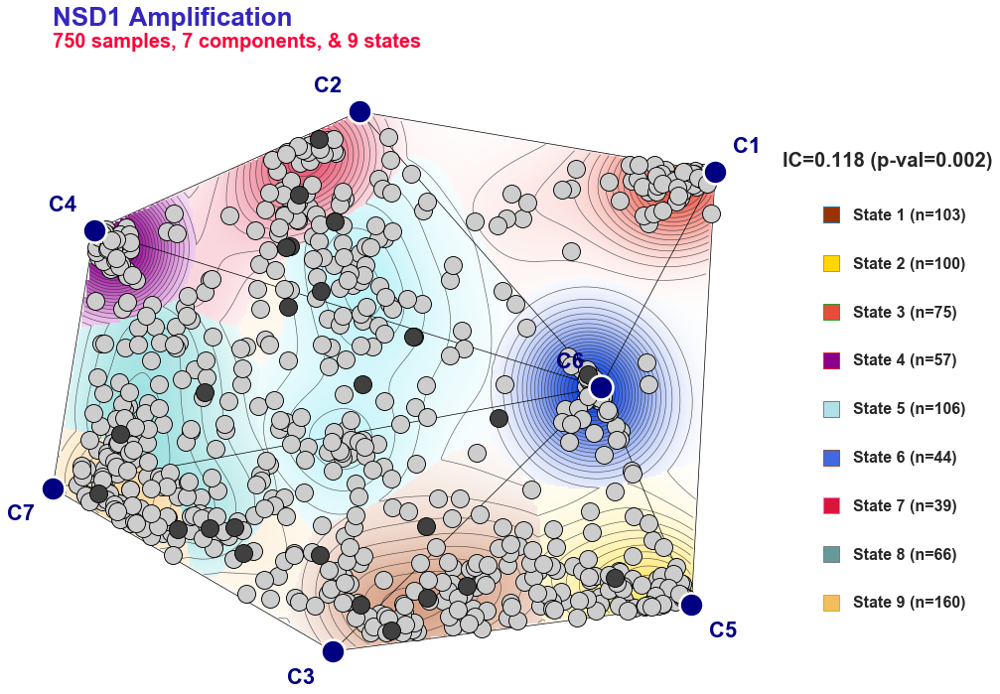

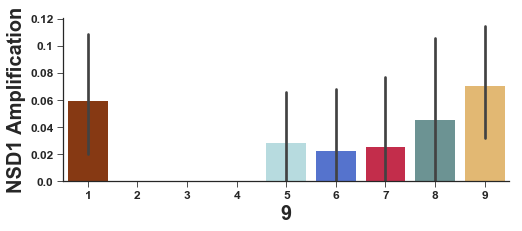

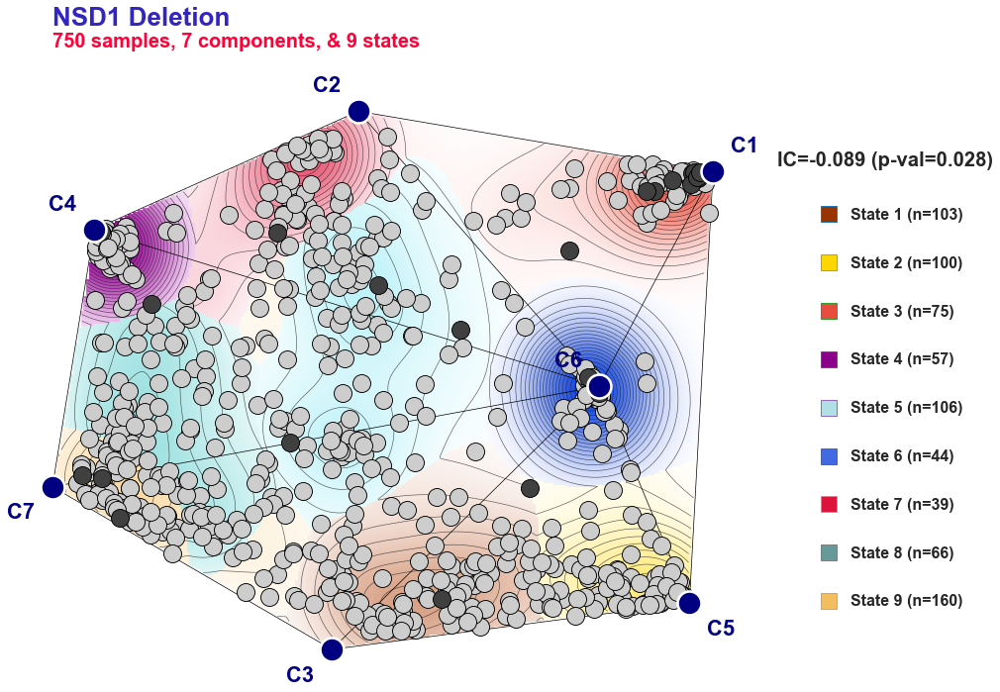

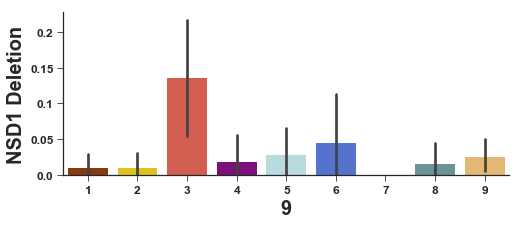

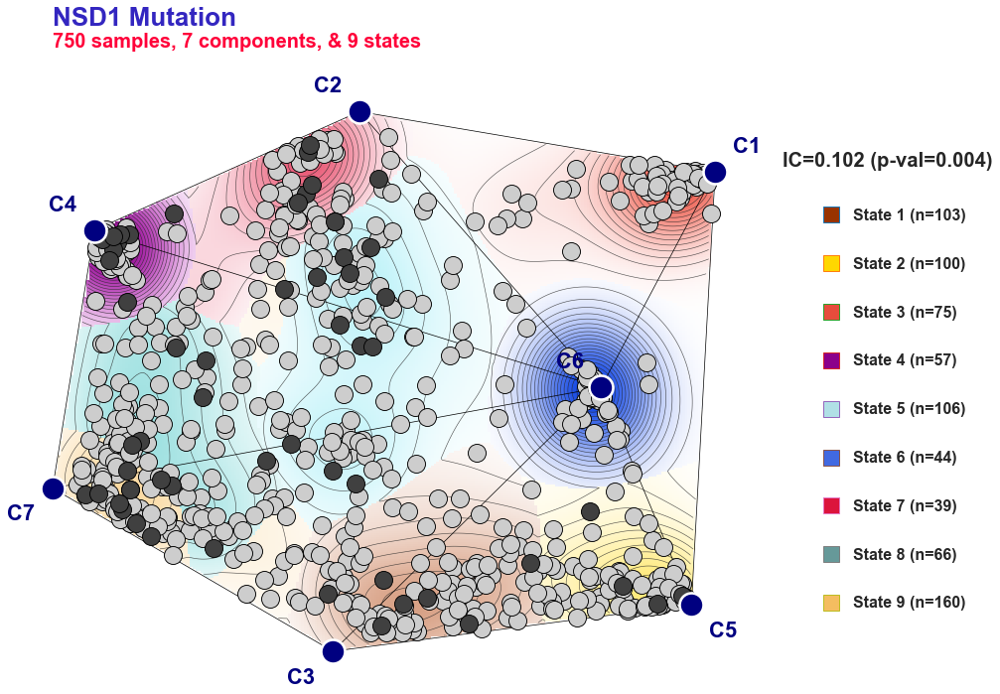

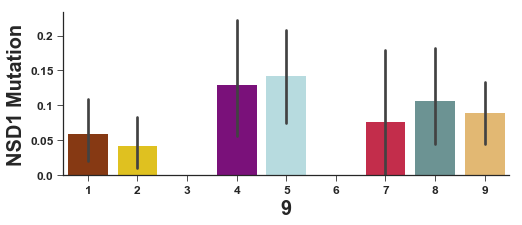

In [29]:
for i, alias in [('NSD1_AMP', 'NSD1 Amplification'),
                 ('NSD1_DEL', 'NSD1 Deletion'),
                 ('NSD1_MUT', 'NSD1 Mutation')]:
        
    annotation = mut_cna_df.ix[i, :]
    annotation.name = alias
    
    ccal.oncogps.make_oncogps(training_h = h_matrix, 
                                                  training_states = global_sample_labels, 
                                                  training_annotation=annotation,
                                                  annotation_type = 'binary',
                                                  title=annotation.name,
                                                  power = 2.5,
                                                  component_markersize = 24,
                                                  component_fontsize = 22,
                                                  component_markerfacecolor='#000080',
                                                  sample_markersize = 18,
                                                  mds_seed = 1234,
                                                  std_max = 2,
                                                  informational_mds = False,
                                                  state_colors = colors,
                                                  annotation_ascending=False,
                                                  kde_bandwidth_factor=1.25,
                                                  component_names = component_names)
                                                  #filepath = DIR_RESULT + '/Platinum_Resistance/Onco-GPS_Feature_{}.pdf'.format(annotation.name))
    
    ccal.plot_violin_box_or_bar(global_sample_labels, annotation.ix[global_sample_labels.index], colors=colors,
                                                       violin_or_box='box', figure_size=(8, 3))

<hr style="border: none; border-bottom: 3px solid #88BBEE;">
### Display Ovarian Cancer subtype 

In [19]:
ov_CA_subtype_df = ccal.read_gct('../data/ov_CA_subtypes.gct') 
cell_types = ov_CA_subtype_df.columns
found = False
for cell in cell_types:
    found = False
    for col in tissue_df.columns:
        if col.startswith(cell):
            ov_CA_subtype_df = ov_CA_subtype_df.rename(columns={cell:col})
            found = True
    if not found:
        print(cell)    
ov_CA_subtype_df

2774
COV362.4
COV413A
COV413B
PEO1
PEO4
PEO16
CAOV318
OV17R
PEO14
PEO23
SKOV6
UWB1.289
HOC7


,COV644_OVARY,2774,X59M_OVARY,COV362_OVARY,COV362.4,ES2_OVARY,IGROV1_OVARY,OV7_OVARY,TOV112D_OVARY,TOV21G_OVARY,...,OAW28_OVARY,OV17R,PEO14,PEO23,SKOV6,CAOV3_OVARY,COV504_OVARY,OAW42_OVARY,UWB1.289,HOC7
S,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,1,1,1,1,0
HGS,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,1,0,0,0,0,0
LGS,0,0,0,0,0,0,0,0,0,0,...,0,0,1,1,0,0,0,0,0,1
E,0,1,0,1,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
C,0,0,0,0,0,1,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
Mx,0,0,1,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
M,1,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


In [20]:
ov_CA_subtype_df.ix['All Serous'] = ov_CA_subtype_df.ix['S'] + ov_CA_subtype_df.ix['HGS'] + ov_CA_subtype_df.ix['LGS']

In [21]:
ov_CA_subtype_df.ix['Non Serous'] = ov_CA_subtype_df.ix['E'] + ov_CA_subtype_df.ix['C'] + ov_CA_subtype_df.ix['Mx' ]+ ov_CA_subtype_df.ix['M']

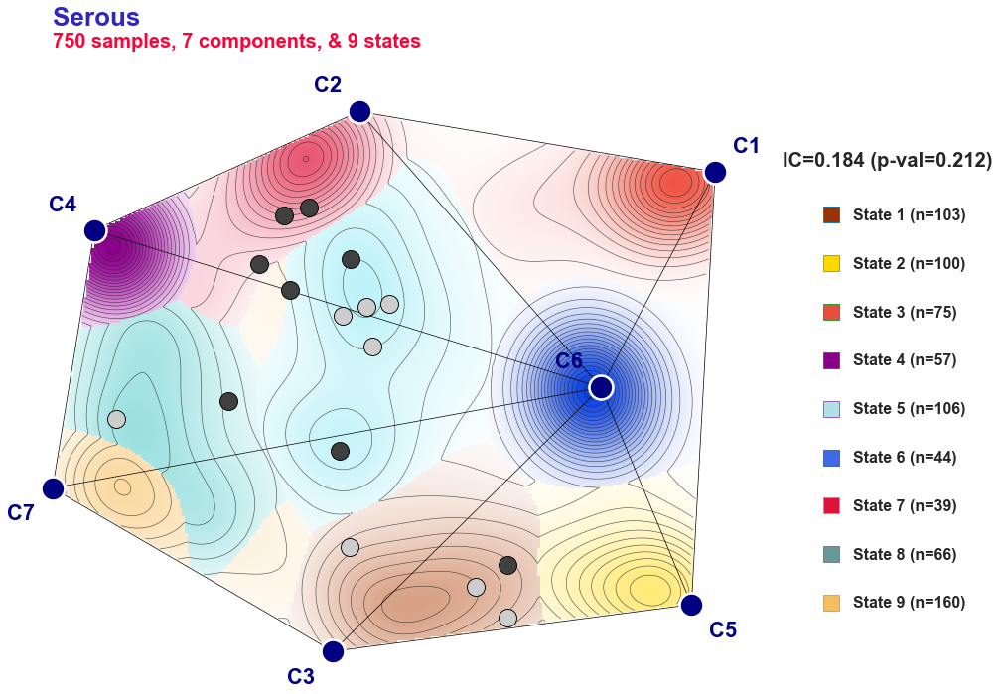

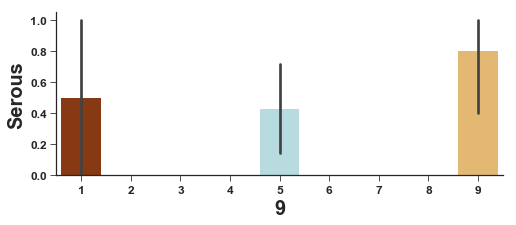

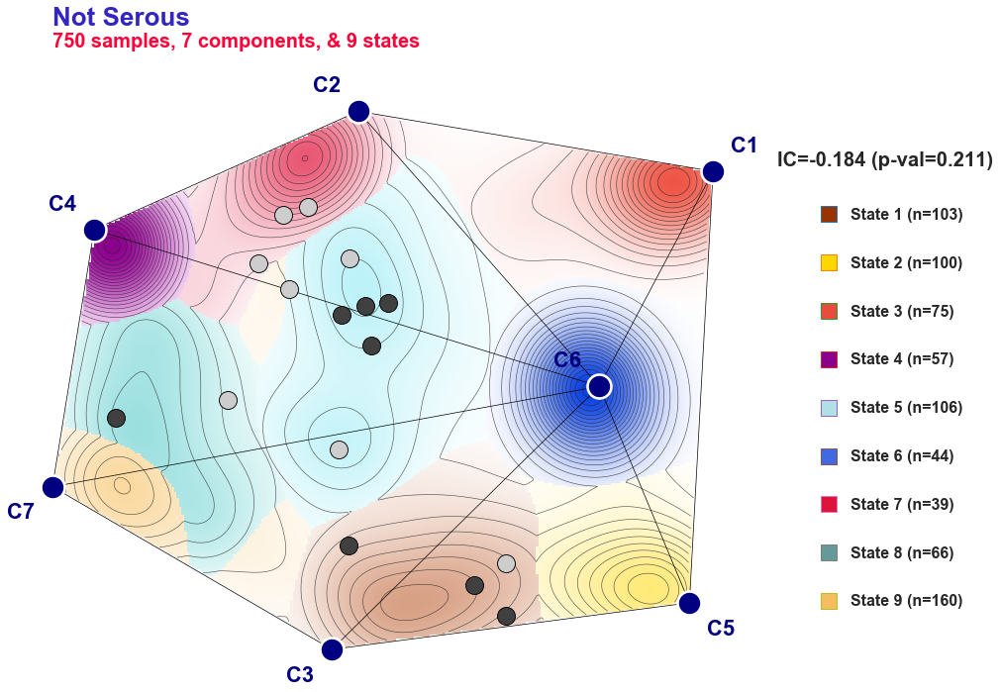

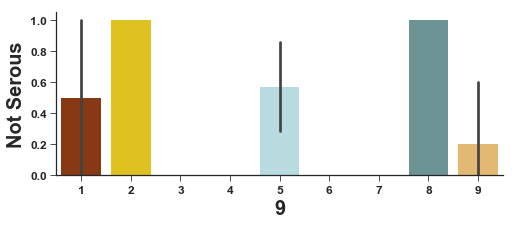

In [23]:
for i, alias in [('All Serous', 'Serous'),
                 ('Non Serous', 'Not Serous')]:
                  #('E', 'Endometrioid'),
                  #('C', 'Clear Cell'),
                  #('Mx', 'Mixed'),
                  #('M','Mucinous'),
                  #('HGS', 'High-Grade Serous'),
                  #('S', 'Serous'),
                  #('LGS','Low-Grade Serous')]:
    
    annotation = ov_CA_subtype_df.ix[i, :]
    annotation.name = alias
    
    ccal.oncogps.make_oncogps(training_h = h_matrix, 
                                                  training_states = global_sample_labels,
                                                  annotation_type='binary',
                                                  training_annotation=annotation,
                                                  title=annotation.name,
                                                  power = 2.5,
                                                  component_markersize = 24,
                                                  component_fontsize = 22,
                                                  component_markerfacecolor='#000080',
                                                  sample_markersize = 18,
                                                  mds_seed = 1234,
                                                  std_max = 2,
                                                  informational_mds = False,
                                                  state_colors = colors,
                                                  kde_bandwidth_factor=1.25,
                                                  component_names = component_names)
                                                  #filepath = DIR_RESULT + 'Global_Onco-GPS_Feature_{}.pdf'.format(annotation.name))
    
    ccal.plot_violin_box_or_bar(global_sample_labels, annotation.ix[global_sample_labels.index], colors=colors,
                                                  violin_or_box='box', figure_size=(8,3))

In [22]:
cross_resistant_drugs = ['JQ-1',
                        'azacitidine',
                        'decitabine',
                        'zebularine',
                        'RG-108',
                        'vorinostat',
                        'nelarabine',
                        'topotecan',
                        'etoposide',
                        'doxorubicin',
                        'teniposide',
                        'elocalcitol',
                        'darinaparsin',
                        'docetaxel',
                        'cyclophosphamide',
                        'paclitaxel',
                        'ifosfamide',
                        'temozolomide',
                        'procarbazine',
                        'bendamustine',
                        'chlorambucil',
                        'cytarabine hydrochloride',
                        'clofarabine',
                        'dacarbazine',
                        'mitomycin',
                        'vincristine',
                        'bleomycin A2']

In [25]:
cross_resistant_drug_tuples = []
for drug in cross_resistant_drugs:
    cross_resistant_drug_tuples.append((drug,drug))

In [26]:
# Checking how many of these drugs are actually in our datasets.
print('Total number of drugs: ' + str(len(cross_resistant_drugs)))

Total number of drugs: 27


In [27]:
df_one = drug_sensitivity_df.index
len(set(df_one).intersection(cross_resistant_drugs))

27

In [28]:
df_two = drug_sensitivity2_df.index
len(set(df_two).intersection(cross_resistant_drugs))

23

In [29]:
drug_sensitivity_df.head().shape

(5, 645)

NOTE: The number of samples represented in the first and second drug sensitivity dataframes is different. However, all of the drugs are contained within the first. Need to look further into why these are different. 

In [30]:
drug_sensitivity2_df.head().shape

(5, 876)

In [31]:
gene_expression_df.shape

(48642, 750)

## Display cross resistance drugs from Olivier's list

In [ ]:
for i, alias in cross_resistant_drug_tuples:
    
    annotation = drug_sensitivity_df.ix[i, :]
    annotation.name = alias
    
    ccal.oncogps.make_oncogps(training_h = h_matrix, 
                                                  training_states = global_sample_labels,
                                                  training_annotation=annotation,
                                                  title=annotation.name,
                                                  power = 2.5,
                                                  component_markersize = 24,
                                                  component_fontsize = 22,
                                                  component_markerfacecolor='#000080',
                                                  sample_markersize = 18,
                                                  mds_seed = 1234,
                                                  std_max = 2,
                                                  informational_mds = False,
                                                  state_colors = colors,
                                                  kde_bandwidth_factor=1.25,
                                                  component_names = component_names)
                                                  #filepath = DIR_RESULT + 'Global_Onco-GPS_Feature_{}.pdf'.format(annotation.name))
    
    ccal.plot_violin_box_or_bar(global_sample_labels, annotation.ix[global_sample_labels.index], colors=colors,
                                                  violin_or_box='box', figure_size=(8,3))

## BRCA1 and BRCA2 Gene Expression

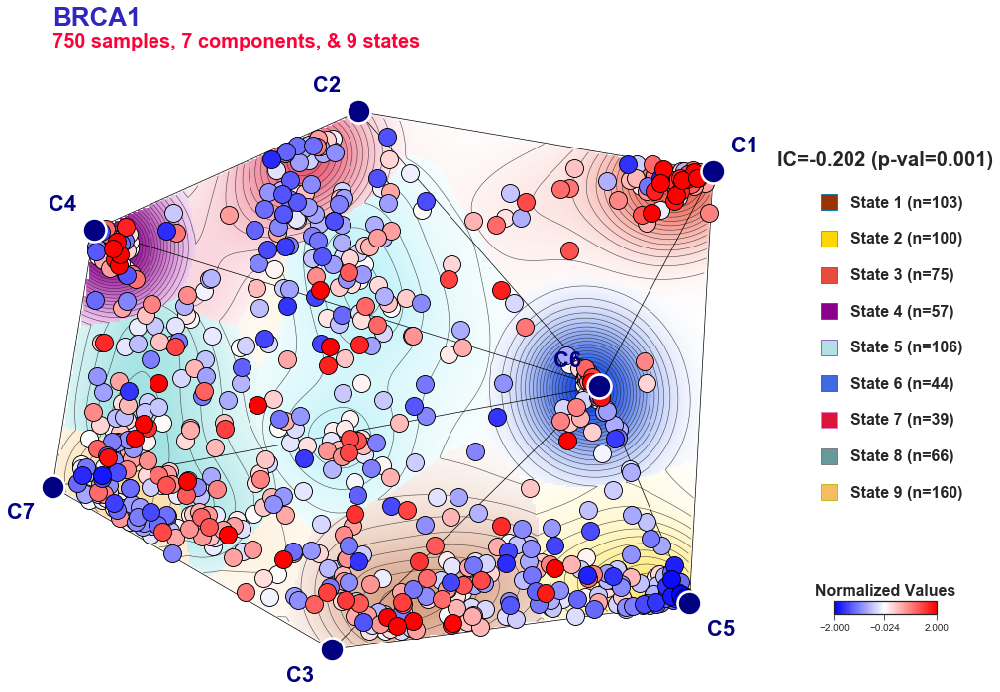

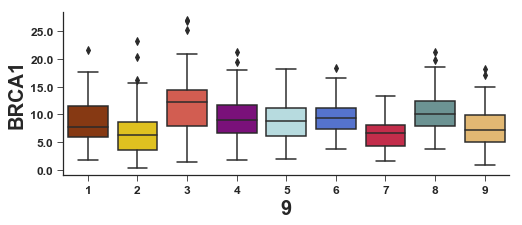

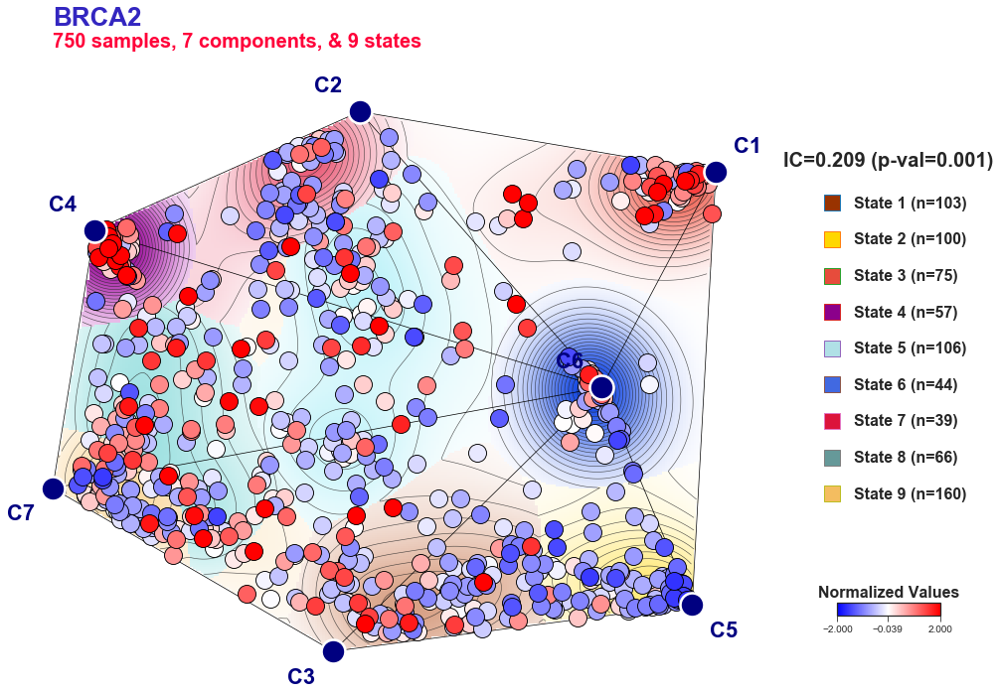

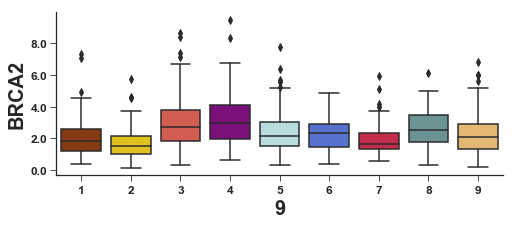

In [8]:
for i, alias in [('BRCA1','BRCA1'),('BRCA2','BRCA2')]:
    
    annotation = gene_expression_df.ix[i, :]
    annotation.name = alias
    
    ccal.oncogps.make_oncogps(training_h = h_matrix, 
                                                  training_states = global_sample_labels,
                                                  training_annotation=annotation,
                                                  title=annotation.name,
                                                  power = 2.5,
                                                  component_markersize = 24,
                                                  component_fontsize = 22,
                                                  component_markerfacecolor='#000080',
                                                  sample_markersize = 18,
                                                  mds_seed = 1234,
                                                  std_max = 2,
                                                  informational_mds = False,
                                                  state_colors = colors,
                                                  kde_bandwidth_factor=1.25,
                                                  component_names = component_names)
                                                  #filepath = DIR_RESULT + 'Global_Onco-GPS_Feature_{}.pdf'.format(annotation.name))
    
    ccal.plot_violin_box_or_bar(global_sample_labels, annotation.ix[global_sample_labels.index], colors=colors,
                                                  violin_or_box='box', figure_size=(8,3))

## BRCA1 and BRCA2 Mutations

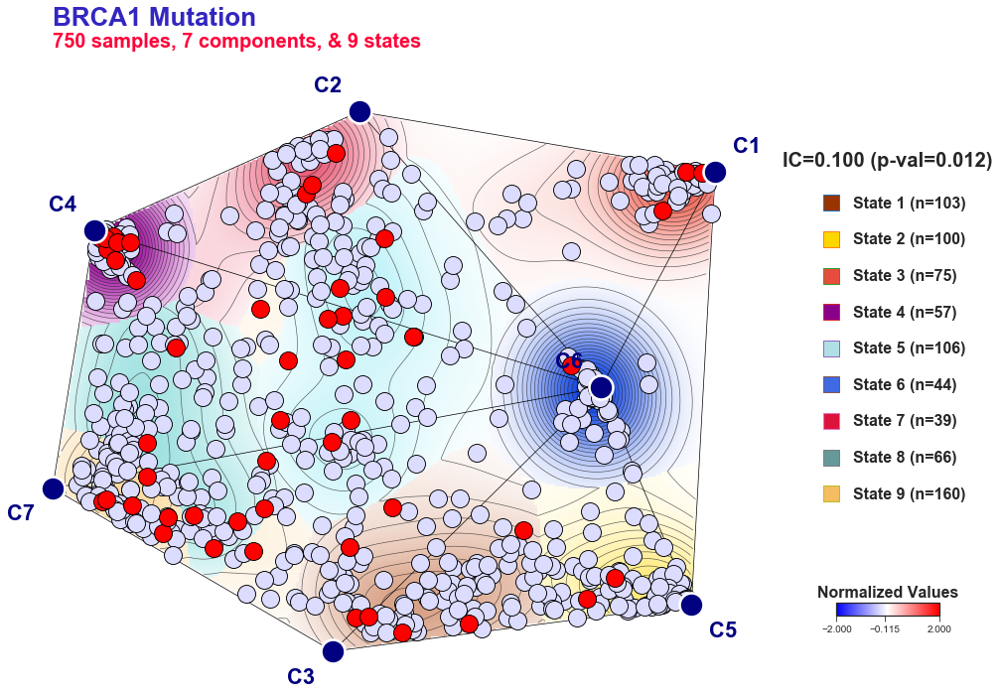

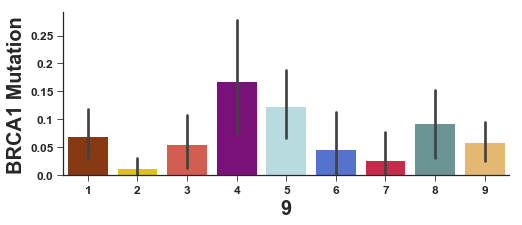

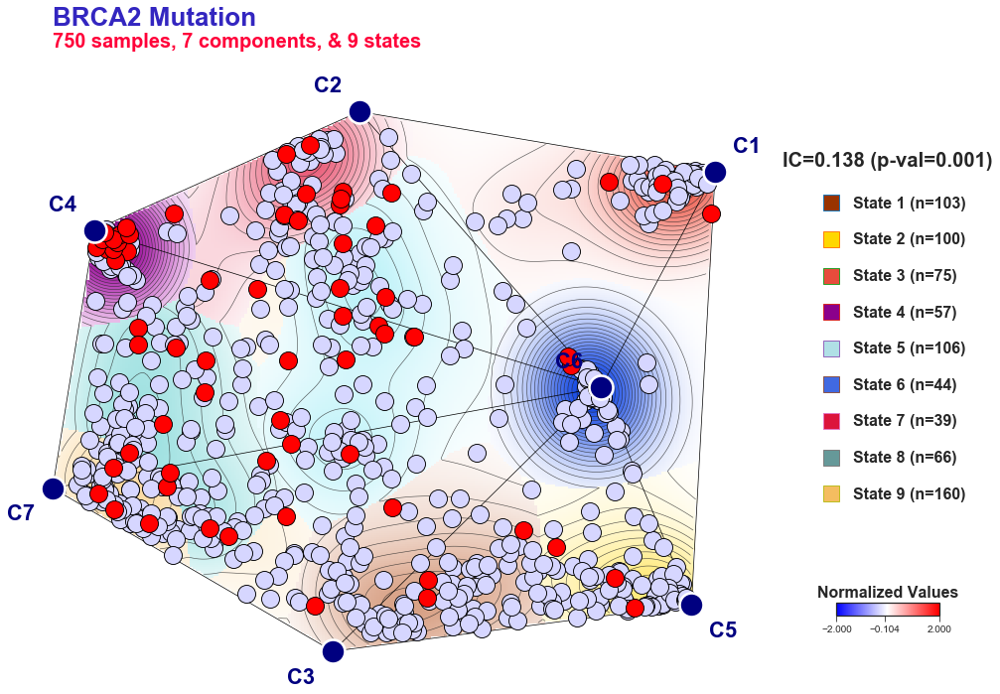

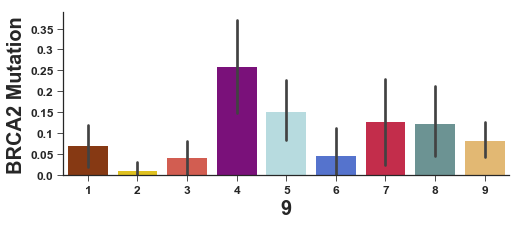

In [9]:
for i, alias in [('BRCA1_MUT', 'BRCA1 Mutation'),('BRCA2_MUT', 'BRCA2 Mutation')]:
    
    annotation = mut_cna_df.ix[i, :]
    annotation.name = alias
    
    ccal.oncogps.make_oncogps(training_h = h_matrix, 
                                                  training_states = global_sample_labels,
                                                  training_annotation=annotation,
                                                  title=annotation.name,
                                                  power = 2.5,
                                                  component_markersize = 24,
                                                  component_fontsize = 22,
                                                  component_markerfacecolor='#000080',
                                                  sample_markersize = 18,
                                                  mds_seed = 1234,
                                                  std_max = 2,
                                                  informational_mds = False,
                                                  state_colors = colors,
                                                  kde_bandwidth_factor=1.25,
                                                  component_names = component_names)
                                                  #filepath = DIR_RESULT + 'Global_Onco-GPS_Feature_{}.pdf'.format(annotation.name))
    
    ccal.plot_violin_box_or_bar(global_sample_labels, annotation.ix[global_sample_labels.index], colors=colors,
                                                  violin_or_box='box', figure_size=(8,3))

## Display potentially cross resistant drugs from Olivier's annotated CCLE drug list

In [33]:
drugs = pd.read_csv('../data/Cross_resistant_drugs_summary.txt', '\t')

In [34]:
drugs

,Drug Name,Drug Activity/Target
0,cyclophosphamide,DNA alkylator
1,ifosfamide,DNA alkylator
2,temozolomide,DNA alkylator
3,bendamustine,DNA alkylator
4,chlorambucil,DNA alkylator
5,dacarbazine,DNA alkylator
6,oxaliplatin,DNA crosslinker
7,mitomycin,DNA crosslinker
8,procarbazine,Inducer of DNA damage
9,cytarabine hydrochloride,Inducer of DNA damage


In [35]:
cross_resistant_drug_tuples = []
for drug in drugs['Drug Name']:
    cross_resistant_drug_tuples.append((drug,drug))

## Display boxplots for potentially cross resistant drugs from Olivier's annotated CCLE drug list

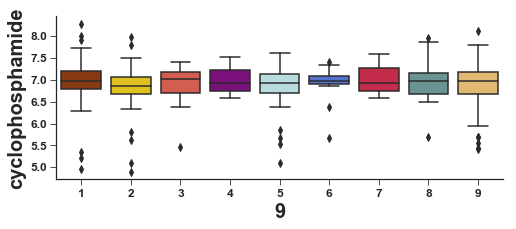

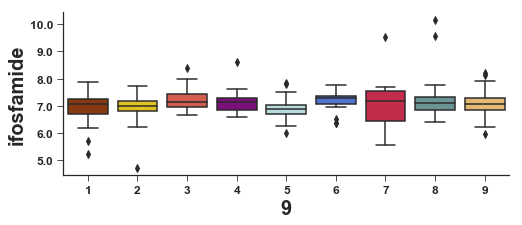

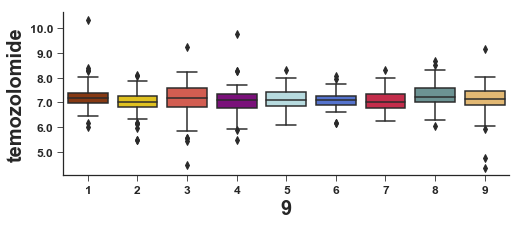

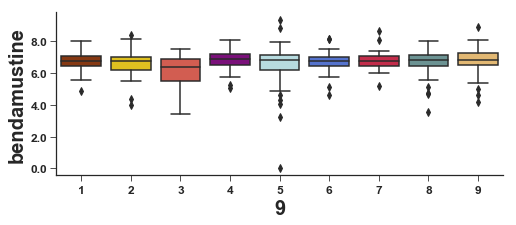

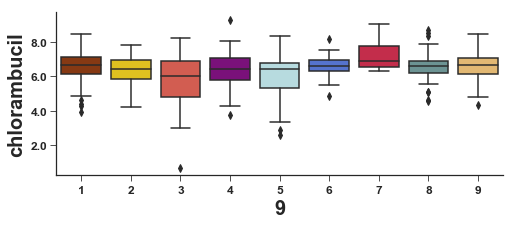

...

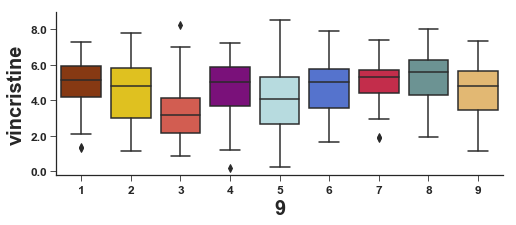

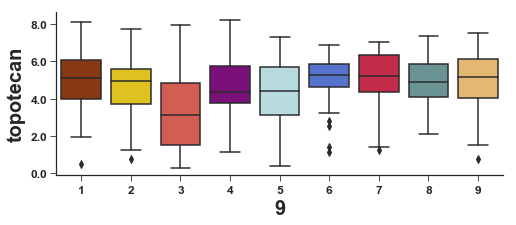

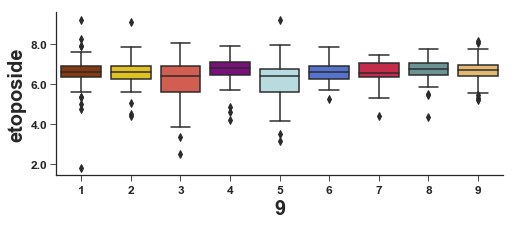

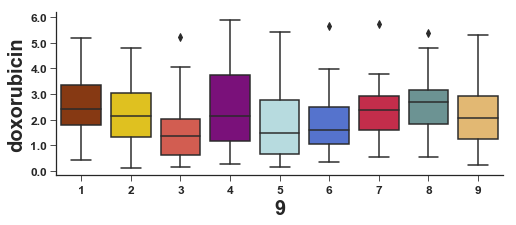

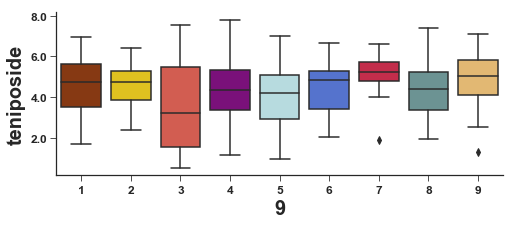

In [36]:
df_one_only=['mitomycin','cytarabine hydrochloride','bleomycin A2']
for i, alias in cross_resistant_drug_tuples:
    if i not in df_one_only:
        annotation = drug_sensitivity2_df.ix[i, :]
    else:
        annotation = drug_sensitivity_df.ix[i, :]
    annotation.name = alias  
    ccal.plot_violin_box_or_bar(global_sample_labels, annotation.ix[global_sample_labels.index], colors=colors,
                                                  violin_or_box='box', figure_size=(8,3))

In [260]:
global_sample_labels = pd.DataFrame(global_sample_labels)
global_sample_labels.columns = ['State']
global_sample_labels

,State
A101D_SKIN,6
A172_CENTRAL_NERVOUS_SYSTEM,2
A204_SOFT_TISSUE,5
A2058_SKIN,6
A2780_OVARY,5
A375_SKIN,6
A498_KIDNEY,1
A549_LUNG,1
A673_BONE,5
A704_KIDNEY,1


In [261]:
all_averages = pd.DataFrame()
df_one_only=['mitomycin','cytarabine hydrochloride','bleomycin A2']
for i, alias in cross_resistant_drug_tuples:    
    if i not in df_one_only:
        annotation = drug_sensitivity2_df.ix[i, :]
    else:
        annotation = drug_sensitivity_df.ix[i, :]
    annotation.name = alias  
    annotations  = pd.DataFrame(annotation.ix[global_sample_labels.index])
    averages = ((pd.concat([annotations, global_sample_labels], axis=1)).dropna()).groupby('State').mean()
    all_averages= pd.concat([all_averages,averages],axis=1)
#averages.pivot('State')
#sns.heatmap(averages.pivot(),cmap="coolwarm")



## Display average drug sensitivity per state

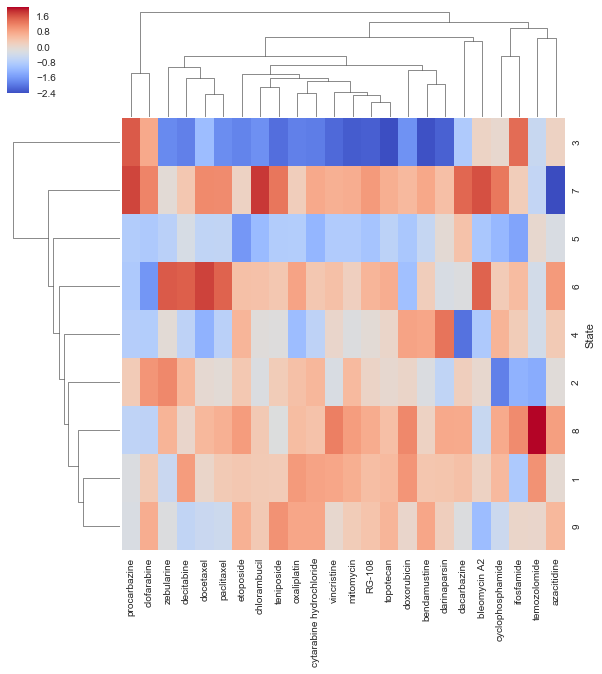

In [262]:
sns.clustermap(all_averages,cmap="coolwarm",z_score=1)

In [292]:
#(all_averages.reset_index()).pivot(columns='State')
#all_averages.reset_index()
pivoted_values = pd.pivot_table(all_averages.reset_index(),columns='State')
pivoted_values

State,1,2,3,4,5,6,7,8,9
RG-108,6.762441,6.633235,5.852116,6.573710,6.273090,6.804312,6.916737,6.849131,6.731905
azacitidine,6.854983,6.842051,6.886223,6.913493,6.816650,7.033018,6.421076,7.022120,6.964999
bendamustine,6.736463,6.620875,6.191827,6.820877,6.554474,6.705864,6.819911,6.690610,6.823563
bleomycin A2,12.429184,12.348025,12.417164,11.790982,11.751903,13.299327,13.401923,12.009951,11.642029
chlorambucil,6.567822,6.347918,5.701176,6.381622,5.951199,6.630665,7.234526,6.573013,6.574215
clofarabine,6.423828,6.606261,6.547427,6.142972,6.127913,5.930583,6.648717,6.181744,6.531503
cyclophosphamide,6.958084,6.773973,6.916509,6.963903,6.826811,6.936200,7.013950,6.972542,6.880993
cytarabine hydrochloride,13.130816,12.936645,10.972815,11.952742,11.522335,12.743338,13.074737,12.798509,13.110082
dacarbazine,6.526362,6.496345,6.369167,6.226702,6.522480,6.447450,6.647300,6.560765,6.447871
darinaparsin,7.218990,7.015785,6.695261,7.410748,7.131339,7.088062,7.236009,7.295384,7.183847


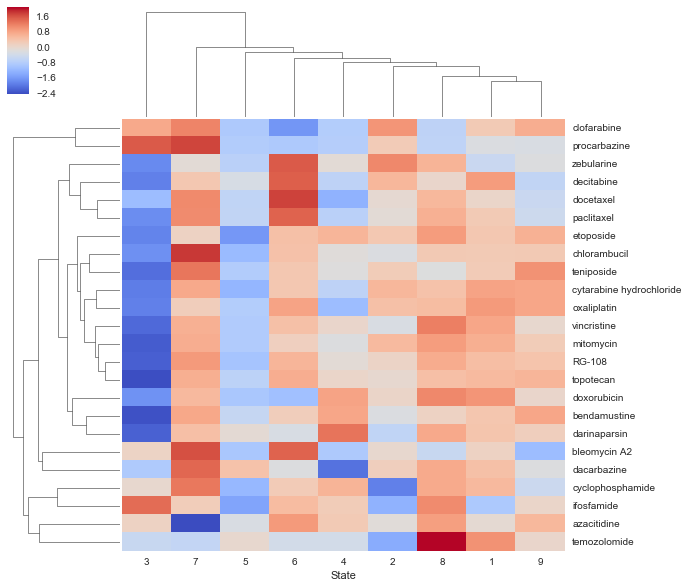

In [264]:
sns.clustermap(pivoted_values,cmap="coolwarm", z_score=0)

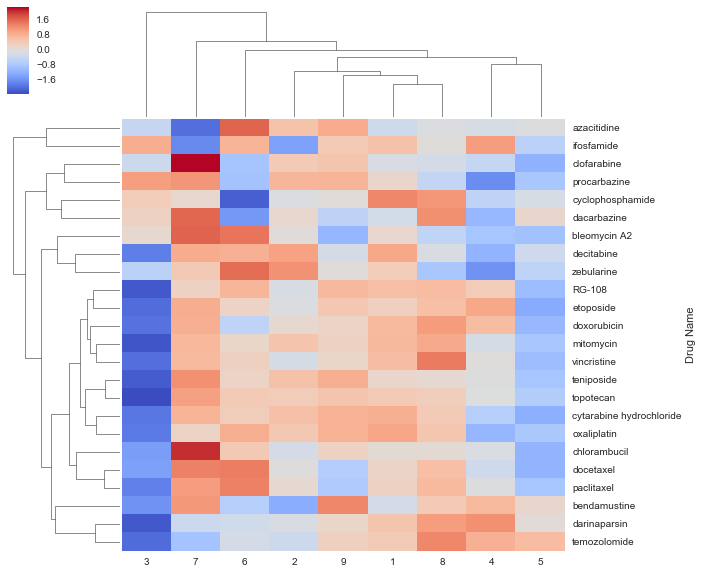

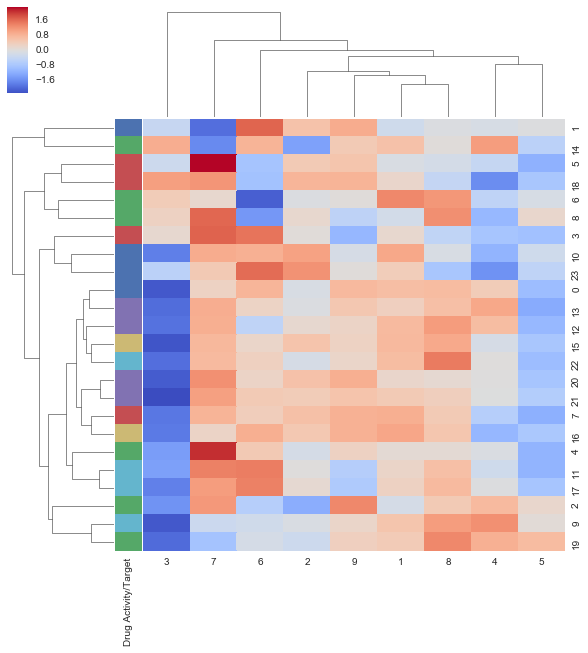

In [196]:
#Drug_Type = drugs.pop('Drug Activity/Target')
sns.set(color_codes=True)
data_to_plot = pd.merge(pivoted_values.reset_index().rename(columns={'index': 'Drug Name'}),drugs,on='Drug Name')
#df.rename(columns={'oldName1': 'newName1', 'oldName2': 'newName2'})
drug_type = data_to_plot.pop('Drug Activity/Target')
g = sns.clustermap(data_to_plot.set_index('Drug Name'),cmap="coolwarm",z_score=0)

lut = dict(zip(drug_type.unique(),'bgrcmy'))
row_colors = drug_type.map(lut)
g = sns.clustermap(data_to_plot.set_index('Drug Name').reset_index(drop=True),cmap="coolwarm", row_colors=row_colors,z_score=0) 

In [ ]:
#Drug_Type = drugs.pop('Drug Activity/Target')
sns.set(color_codes=True)
data_to_plot = pd.merge(pivoted_values.reset_index().rename(columns={'index': 'Drug Name'}),drugs,on='Drug Name')
#df.rename(columns={'oldName1': 'newName1', 'oldName2': 'newName2'})
drug_type = data_to_plot.pop('Drug Activity/Target')
g = sns.clustermap(data_to_plot.set_index('Drug Name'),cmap="coolwarm",z_score=0)

lut = dict(zip(drug_type.unique(),'bgrcmy'))
row_colors = drug_type.map(lut)
g = sns.clustermap(data_to_plot.set_index('Drug Name').reset_index(drop=True),cmap="coolwarm", row_colors=row_colors,z_score=0)

In [312]:
data_to_plot.set_index('Drug Name')

,1,2,3,4,5,6,7,8,9
Drug Name,,,,,,,,,
RG-108,14.684121,14.469448,13.905636,14.619077,14.242087,14.720579,14.587346,14.695055,14.701378
azacitidine,14.682337,14.837866,14.656800,14.705342,14.722378,15.041286,14.364308,14.719151,14.898356
bendamustine,14.621568,14.487194,14.442296,14.738903,14.668095,14.562639,14.795375,14.705537,14.819313
bleomycin A2,12.429184,12.348025,12.417164,11.790982,11.751903,13.299327,13.401923,12.009951,11.642029
chlorambucil,13.938461,13.798091,13.121353,13.841342,13.292196,14.148919,15.025125,13.940870,14.060519
clofarabine,11.320793,11.714500,11.172756,11.097752,10.578227,10.788086,13.016226,11.253524,11.776615
cyclophosphamide,15.031041,14.783800,14.870357,14.707577,14.770522,14.419419,14.825250,15.001114,14.798556
cytarabine hydrochloride,13.130816,12.936645,10.972815,11.952742,11.522335,12.743338,13.074737,12.798509,13.110082
dacarbazine,14.435000,14.468265,14.481258,14.359395,14.469714,14.319757,14.599296,14.564945,14.406904


## Calculating spearman's correlation between drug resistance and component value 

In [380]:
res_and_component = pd.DataFrame(index=drugs['Drug Name'], columns=h_matrix.index)
num_samples = []
df_one_only=['mitomycin','cytarabine hydrochloride','bleomycin A2']
for drug in drugs['Drug Name']:
    for component in h_matrix.index:
        if drug not in df_one_only:
            one_drug_one_k = pd.concat([drug_sensitivity2_df.loc[drug],h_matrix.loc[component]],axis=1).dropna() 
        else:
            one_drug_one_k = pd.concat([drug_sensitivity_df.loc[drug],h_matrix.loc[component]],axis=1).dropna() 
        num_samples.append(one_drug_one_k.shape[0])
        # Take the spearman correlation coefficient, rho
        res_and_component.loc[drug, component] = spearmanr(one_drug_one_k)[0] 

In [381]:
res_and_component.loc['oxaliplatin']

C1    -0.157944
C2   -0.0587259
C3     0.127271
C4   -0.0964015
C5     0.186465
C6    0.0499315
C7     0.211943
Name: oxaliplatin, dtype: object

Text(0.5,1,'Correlation between Drug Sensitivity and Component')

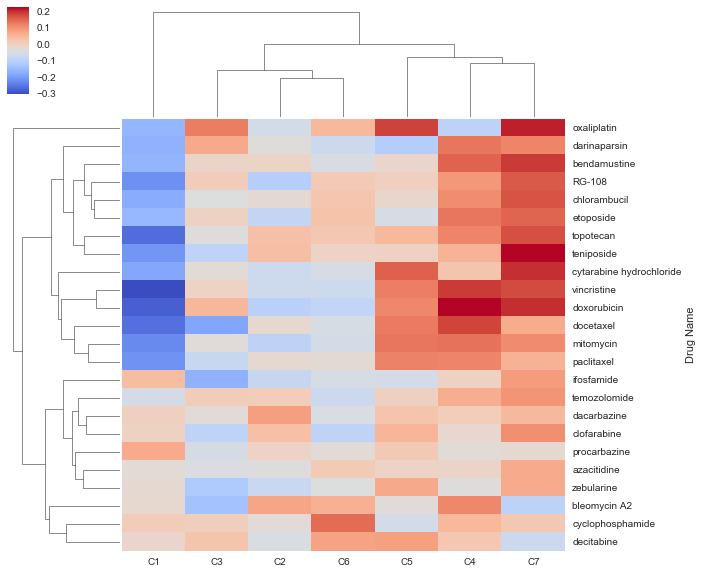

In [344]:
sns.clustermap(res_and_component[res_and_component.columns].astype(float),cmap="coolwarm")
ax.set_title('Correlation between Drug Sensitivity and Component')

## Calculating spearman's correlation in drug comparative matrix

In [356]:
res_and_res = pd.DataFrame(index=drugs['Drug Name'], columns=drugs['Drug Name'])
df_one_only=['mitomycin','cytarabine hydrochloride','bleomycin A2']
for drug_one in drugs['Drug Name']:
    for drug_two in drugs['Drug Name']:
        if drug_one not in df_one_only:
            drug_one_vals = drug_sensitivity2_df.loc[drug_one]
        else:
            drug_one_vals = drug_sensitivity_df.loc[drug_one]
        if drug_two not in df_one_only:
            drug_two_vals = drug_sensitivity2_df.loc[drug_two]
        else:
            drug_two_vals = drug_sensitivity_df.loc[drug_two]
        two_drug= pd.concat([drug_one_vals,drug_two_vals],axis=1)
        # Take the spearman correlation coefficient, rho
        res_and_res.loc[drug_one, drug_two] = spearmanr(two_drug)[0] 

Text(0.5,1,'Correlation between Drugs')

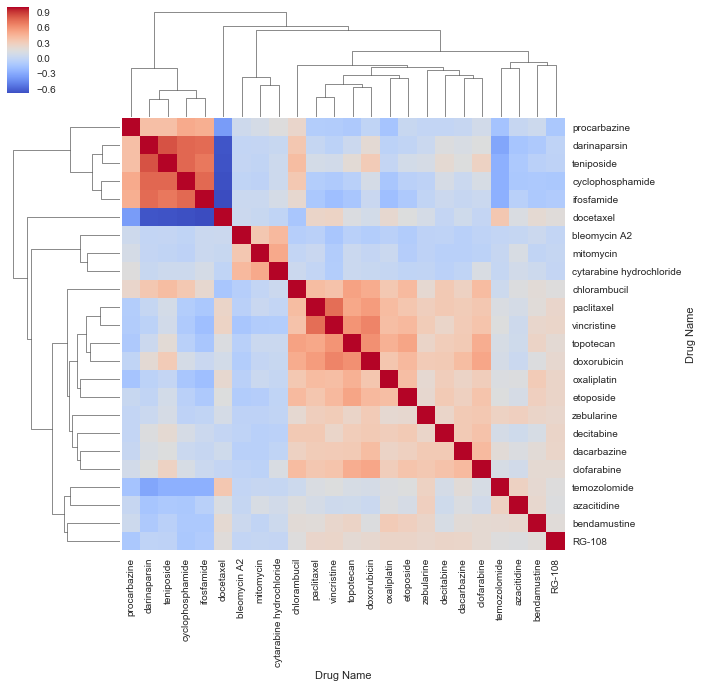

In [358]:
sns.clustermap((res_and_res[res_and_res.columns].dropna()).astype(float),cmap="coolwarm")
ax.set_title('Correlation between Drugs')

In [359]:
res_and_res

Drug Name,cyclophosphamide,ifosfamide,temozolomide,bendamustine,chlorambucil,dacarbazine,oxaliplatin,mitomycin,procarbazine,cytarabine hydrochloride,...,decitabine,RG-108,zebularine,docetaxel,paclitaxel,vincristine,topotecan,etoposide,doxorubicin,teniposide
Drug Name,,,,,,,,,,,,,,,,,,,,,
cyclophosphamide,1,0.75687,-0.261128,-0.109483,0.345415,0.0433373,-0.129635,-0.0258396,0.505492,0.0579174,...,0.110436,-0.116717,-0.0269316,-0.671157,-0.0770893,-0.0934965,-0.0504729,-0.0462072,0.101627,0.769346
ifosfamide,0.75687,1,-0.263967,-0.108705,0.222007,0.0219391,-0.172951,0.0428456,0.480633,0.10153,...,0.048461,-0.0923437,-0.00549585,-0.685297,-0.114339,-0.177559,-0.127468,-0.102946,0.0356223,0.708915
temozolomide,-0.261128,-0.263967,1,0.211303,0.0526326,0.18459,0.138277,0.0222698,-0.147614,0.0172339,...,0.103156,0.160306,0.271952,0.352638,0.132711,0.153543,0.115415,0.154582,0.103924,-0.260083
bendamustine,-0.109483,-0.108705,0.211303,1,0.183825,0.184588,0.323378,-0.00405415,0.0559872,0.0560142,...,0.113627,0.180141,0.255342,0.203956,0.178483,0.232291,0.261854,0.292681,0.146125,-0.044108
chlorambucil,0.345415,0.222007,0.0526326,0.183825,1,0.279249,0.342469,0.00330661,0.237932,0.046133,...,0.339016,0.1612,0.214509,-0.128798,0.4078,0.38098,0.541441,0.424555,0.498675,0.411549
dacarbazine,0.0433373,0.0219391,0.18459,0.184588,0.279249,1,0.259295,-0.0529816,0.0238004,-0.009029,...,0.331881,0.246197,0.333764,0.0715586,0.319863,0.326791,0.328547,0.287234,0.409394,0.152347
oxaliplatin,-0.129635,-0.172951,0.138277,0.323378,0.342469,0.259295,1,0.0436995,-0.143771,0.0147257,...,0.303537,0.25357,0.213379,0.219764,0.419873,0.406819,0.468758,0.401603,0.357062,0.0100893
mitomycin,-0.0258396,0.0428456,0.0222698,-0.00405415,0.00330661,-0.0529816,0.0436995,1,0.10418,0.507788,...,-0.0506901,0.0137937,-0.0226955,0.0321266,0.0334038,-0.083653,0.041407,-0.0691212,0.0101554,-0.00275578
procarbazine,0.505492,0.480633,-0.147614,0.0559872,0.237932,0.0238004,-0.143771,0.10418,1,0.159542,...,0.00363815,-0.11788,0.000130823,-0.359568,-0.0761345,-0.0798006,-0.102353,0.0279929,-0.00959426,0.400436


## Display comparative matrix of drug resistance vs. component for all drugs

In [400]:
drugs = pd.read_csv('../data/Cross_resistant_drugs_summary_all.txt', '\t')
drugs

,Drug Name,Drug Activity/Target
0,cyclophosphamide,Chemotherapy drug
1,ifosfamide,Chemotherapy drug
2,temozolomide,Chemotherapy drug
3,bendamustine,Chemotherapy drug
4,chlorambucil,Chemotherapy drug
5,dacarbazine,Chemotherapy drug
6,oxaliplatin,Chemotherapy drug
7,mitomycin,Chemotherapy drug
8,procarbazine,Chemotherapy drug
9,cytarabine hydrochloride,Chemotherapy drug


In [401]:
res_and_component = pd.DataFrame(index=drugs['Drug Name'], columns=h_matrix.index)
num_samples = []
for drug in drugs['Drug Name']:
    for component in h_matrix.index:
        try:
            one_drug_one_k = pd.concat([drug_sensitivity2_df.loc[drug],h_matrix.loc[component]],axis=1).dropna() 
        except:
            one_drug_one_k = pd.concat([drug_sensitivity_df.loc[drug],h_matrix.loc[component]],axis=1).dropna() 
        num_samples.append(one_drug_one_k.shape[0])
        # Take the spearman correlation coefficient, rho
        res_and_component.loc[drug, component] = spearmanr(one_drug_one_k)[0]

Text(0.5,1,'Correlation between Drug Sensitivity and Component')

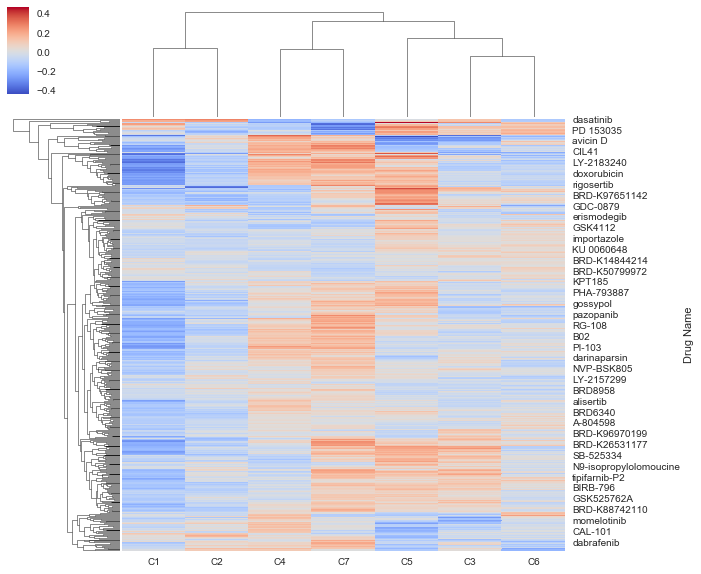

In [402]:
sns.clustermap(res_and_component[res_and_component.columns].astype(float),cmap="coolwarm")
ax.set_title('Correlation between Drug Sensitivity and Component')

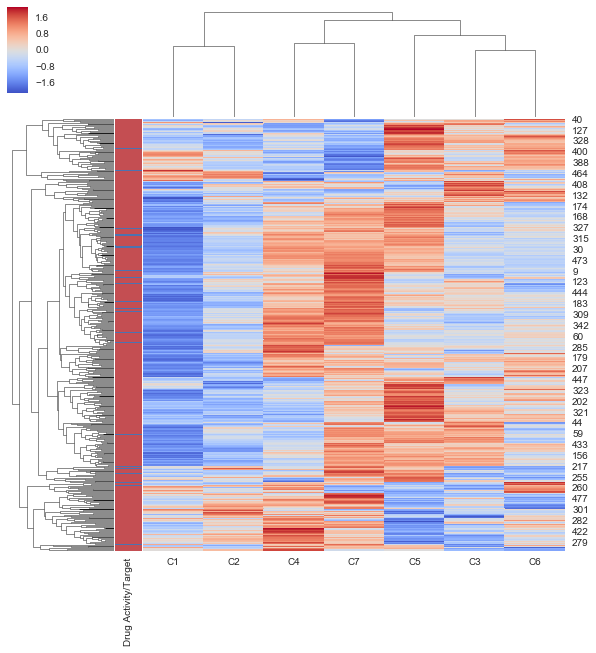

In [407]:
#Drug_Type = drugs.pop('Drug Activity/Target')
sns.set(color_codes=True)
data_to_plot = pd.merge(res_and_component.reset_index().rename(columns={'index': 'Drug Name'}),drugs,on='Drug Name').dropna()
drug_type = data_to_plot.pop('Drug Activity/Target')


lut = dict(zip(drug_type.unique(),'br'))
row_colors = drug_type.map(lut)
data_to_plot = data_to_plot.set_index('Drug Name').reset_index(drop=True)
g = sns.clustermap(data_to_plot[data_to_plot.columns].astype(float),cmap="coolwarm", row_colors=row_colors,z_score=0)

In [ ]:
res_and_res = pd.DataFrame(index=drugs['Drug Name'], columns=drugs['Drug Name'])
for drug_one in drugs['Drug Name']:
    for drug_two in drugs['Drug Name']:
        try:
            drug_one_vals = drug_sensitivity2_df.loc[drug_one]
        except:
            drug_one_vals = drug_sensitivity_df.loc[drug_one]
        try:
            drug_two_vals = drug_sensitivity2_df.loc[drug_two]
        except:
            drug_two_vals = drug_sensitivity_df.loc[drug_two]
        two_drug= pd.concat([drug_one_vals,drug_two_vals],axis=1)
        # Take the spearman correlation coefficient, rho
        res_and_res.loc[drug_one, drug_two] = spearmanr(two_drug)[0] 

In [ ]:
sns.clustermap((res_and_res[res_and_res.columns].dropna()).astype(float),cmap="coolwarm")